In [1]:
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, precision_score, recall_score, precision_recall_curve, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc, roc_auc_score
from sklearn.model_selection import cross_val_score, cross_val_predict

from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import VotingClassifier
from sklearn.pipeline import Pipeline

Data Collection and analysis
EEG Confusion Level



In [2]:
#loading the eeg dataset to a pandas dataframe
eeg_dataset=pd.read_csv('/content/eeg.csv')

In [3]:
#printing the First 5 rows of the dataset
eeg_dataset.head()

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,0.0,0.0,56.0,43.0,278.0,302000.0,90600.0,33700.0,24000.0,27900.0,45100.0,33200.0,8290.0,0.0,0.0
1,0.0,0.0,40.0,35.0,-50.0,73800.0,28100.0,1440.0,2240.0,2750.0,3690.0,5290.0,2740.0,0.0,0.0
2,0.0,0.0,47.0,48.0,101.0,758000.0,384000.0,202000.0,62100.0,36300.0,131000.0,57200.0,25400.0,0.0,0.0
3,0.0,0.0,47.0,57.0,-5.0,2010000.0,129000.0,61200.0,17100.0,11500.0,62500.0,50000.0,33900.0,0.0,0.0
4,0.0,0.0,44.0,53.0,-8.0,1010000.0,354000.0,37100.0,88900.0,45300.0,99600.0,44800.0,29700.0,0.0,0.0


In [4]:
#number of rows and columns in the dataset
eeg_dataset.shape

(12811, 15)

In [5]:
#getting the satistical measures of the data
eeg_dataset.describe()

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
count,12811.000000,12811.000000,12811.000000,12811.000000,12811.000000,1.281100e+04,1.281100e+04,1.281100e+04,1.281100e+04,1.281100e+04,1.281100e+04,1.281100e+04,1.281100e+04,12811.000000,12811.000000
mean,4.487394,4.390602,41.313871,47.182656,65.628288,6.057873e+05,1.680461e+05,4.138325e+04,3.318419e+04,2.431939e+04,3.814329e+04,2.959277e+04,1.441612e+04,0.479978,0.512606
std,2.865373,2.913232,23.152953,22.655976,598.541528,6.376272e+05,2.441232e+05,7.242636e+04,5.831937e+04,3.838424e+04,7.905932e+04,7.983078e+04,3.603291e+04,0.499618,0.499861
min,0.000000,0.000000,0.000000,0.000000,-2050.000000,4.480000e+02,1.700000e+01,2.000000e+00,2.000000e+00,3.000000e+00,2.000000e+00,1.000000e+00,2.000000e+00,0.000000,0.000000
25%,2.000000,2.000000,27.000000,37.000000,-14.000000,9.810000e+04,2.690000e+04,6.840000e+03,6.850000e+03,6.140000e+03,7.360000e+03,4.060000e+03,2.170000e+03,0.000000,0.000000
50%,4.000000,4.000000,43.000000,51.000000,35.000000,3.950000e+05,8.130000e+04,1.750000e+04,1.500000e+04,1.280000e+04,1.580000e+04,9.760000e+03,5.120000e+03,0.000000,1.000000
75%,7.000000,7.000000,57.000000,63.000000,90.000000,9.170000e+05,2.050000e+05,4.480000e+04,3.455000e+04,2.740000e+04,3.550000e+04,2.490000e+04,1.270000e+04,1.000000,1.000000
max,9.000000,9.000000,100.000000,100.000000,2050.000000,3.960000e+06,3.010000e+06,1.370000e+06,1.020000e+06,1.070000e+06,1.650000e+06,1.970000e+06,1.350000e+06,1.000000,1.000000


In [6]:
eeg_dataset['predefinedlabel'].value_counts()


0.0    6662
1.0    6149
Name: predefinedlabel, dtype: int64

In [7]:
eeg_dataset['user-definedlabeln'].value_counts()

1.0    6567
0.0    6244
Name: user-definedlabeln, dtype: int64

0->Student has learned




1->Student hasn't learned


In [8]:
eeg_dataset.groupby('predefinedlabel').mean()

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,user-definedlabeln
predefinedlabel,,,,,,,,,,,,,,
0.0,4.495047,1.951966,41.279195,46.839838,59.521615,598255.593365,167667.639147,40563.770189,33286.267637,24004.28505,45244.851396,34636.872110,15399.424647,0.523566
1.0,4.479102,7.032688,41.351439,47.554074,72.244430,613947.355180,168456.109123,42271.087657,33073.593430,24660.77476,30449.256952,24127.842413,13350.774923,0.500732


In [9]:
eeg_dataset.groupby('user-definedlabeln').mean()

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel
user-definedlabeln,,,,,,,,,,,,,,
0.0,4.437540,4.368994,44.141416,47.728700,66.551570,508627.989430,131106.805573,32343.045804,26770.918642,19930.546124,36557.267617,28664.704997,12438.256726,0.491672
1.0,4.534795,4.411147,38.625400,46.663469,64.750419,698167.791077,203168.499010,49978.799604,39282.019948,28492.358916,39651.302269,30475.183036,16296.696665,0.468859


In [10]:
#separating the data and labels
X=eeg_dataset.drop(columns='predefinedlabel',axis=1)
Y=eeg_dataset['predefinedlabel']

In [11]:
print(X)

       SubjectID  VideoID  Attention  Mediation    Raw      Delta      Theta  \
0            0.0      0.0       56.0       43.0  278.0   302000.0    90600.0   
1            0.0      0.0       40.0       35.0  -50.0    73800.0    28100.0   
2            0.0      0.0       47.0       48.0  101.0   758000.0   384000.0   
3            0.0      0.0       47.0       57.0   -5.0  2010000.0   129000.0   
4            0.0      0.0       44.0       53.0   -8.0  1010000.0   354000.0   
...          ...      ...        ...        ...    ...        ...        ...   
12806        9.0      9.0       64.0       38.0  -39.0   128000.0     9950.0   
12807        9.0      9.0       61.0       35.0 -275.0   323000.0   797000.0   
12808        9.0      9.0       60.0       29.0 -426.0   681000.0   154000.0   
12809        9.0      9.0       60.0       29.0  -84.0   366000.0    27300.0   
12810        9.0      9.0       64.0       29.0  -49.0  1160000.0  1180000.0   

         Alpha1    Alpha2    Beta1     

In [12]:
print(Y)

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
12806    1.0
12807    1.0
12808    1.0
12809    1.0
12810    1.0
Name: predefinedlabel, Length: 12811, dtype: float64


Data Standardization

In [13]:
scaler = StandardScaler()
standardized_data=scaler.fit_transform(X)
standardized_data

array([[-1.56613795, -1.50718299,  0.63433386, ...,  0.04518775,
        -0.17002113, -1.02553872],
       [-1.56613795, -1.50718299, -0.05674966, ..., -0.30444043,
        -0.32405298, -1.02553872],
       [-1.56613795, -1.50718299,  0.24559938, ...,  0.34583542,
         0.30484105, -1.02553872],
       ...,
       [ 1.5749374 ,  1.58229026,  0.80710475, ..., -0.11515767,
        -0.34403549, -1.02553872],
       [ 1.5749374 ,  1.58229026,  0.80710475, ..., -0.21662626,
        -0.3512514 , -1.02553872],
       [ 1.5749374 ,  1.58229026,  0.97987563, ..., -0.0938618 ,
        -0.27576192, -1.02553872]])

In [14]:
X=standardized_data
Y=eeg_dataset['predefinedlabel']

In [15]:
print(X)
print(Y)

[[-1.56613795 -1.50718299  0.63433386 ...  0.04518775 -0.17002113
  -1.02553872]
 [-1.56613795 -1.50718299 -0.05674966 ... -0.30444043 -0.32405298
  -1.02553872]
 [-1.56613795 -1.50718299  0.24559938 ...  0.34583542  0.30484105
  -1.02553872]
 ...
 [ 1.5749374   1.58229026  0.80710475 ... -0.11515767 -0.34403549
  -1.02553872]
 [ 1.5749374   1.58229026  0.80710475 ... -0.21662626 -0.3512514
  -1.02553872]
 [ 1.5749374   1.58229026  0.97987563 ... -0.0938618  -0.27576192
  -1.02553872]]
0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
12806    1.0
12807    1.0
12808    1.0
12809    1.0
12810    1.0
Name: predefinedlabel, Length: 12811, dtype: float64


Train Test Split

In [16]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,stratify=Y,random_state=2,shuffle=True)

In [17]:
print(X.shape, X_train.shape, X_test.shape)

(12811, 14) (10248, 14) (2563, 14)


Training the Model

Classifying the model using Support Vector Machine

In [18]:
classifier=svm.SVC(kernel='poly',degree=3)

In [19]:
#training the support vector machine
classifier.fit(X_train,Y_train)

SVC(kernel='poly')

Classifying the model using Random Forest

In [20]:
rf=RandomForestClassifier(max_features=5, n_estimators=100, criterion='entropy')
rf.fit(X_train,Y_train)

RandomForestClassifier(criterion='entropy', max_features=5)

Naives Bayes

In [21]:
nb=GaussianNB()
nb.fit(X_train,Y_train)

GaussianNB()

Model Evaluation

Accuracy Score

In [22]:
#accuray score from the training data
X_train_prediction=classifier.predict(X_train)
train_data_accuracy=accuracy_score(X_train_prediction,Y_train)

In [23]:
print('Accuracy score of the training data:',train_data_accuracy)

Accuracy score of the training data: 0.9994145199063232


In [24]:
#accuray score from the test data
X_test_prediction=classifier.predict(X_test)
test_data_accuracy=accuracy_score(X_test_prediction,Y_test)

In [25]:
print('Accuracy score of the test data:',test_data_accuracy)

Accuracy score of the test data: 0.9972688255950058


Accuracy for Random Forest Classifier

In [26]:
#accuray score from the training data
X_train_prediction=rf.predict(X_train)
train_data_accuracy2=accuracy_score(X_train_prediction,Y_train)
train_data_accuracy2

1.0

In [27]:
#accuray score from the test data
X_test_prediction=rf.predict(X_test)
test_data_accuracy2=accuracy_score(X_test_prediction,Y_test)
test_data_accuracy2

1.0

Accuracy for Gaussian Naive Bayes Classifier

In [28]:
#accuray score from the training data
X_train_prediction=nb.predict(X_train)
train_data_accuracy3=accuracy_score(X_train_prediction,Y_train)
train_data_accuracy3

0.8915886026541764

In [29]:
#accuray score from the test data
X_test_prediction=nb.predict(X_test)
test_data_accuracy3=accuracy_score(X_test_prediction,Y_test)
test_data_accuracy3

0.8950448692937963

Custom Ensemble Model

In [30]:
# get models
# get a voting ensemble of models
# define the base models
models = list()

svc = Pipeline([('svm', svm.SVC(kernel='poly',degree=3))])
models.append(('svc', svc))

randomforest = Pipeline([('rf', RandomForestClassifier(max_features=5, n_estimators=100, criterion='entropy'))])
models.append(('randomforest', randomforest))

naivebayes = Pipeline([('nb', GaussianNB())])
models.append(('naivebayes', naivebayes))
# define the voting ensemble
ensemble = VotingClassifier(estimators=models, voting='hard')

In [31]:
models

[('svc', Pipeline(steps=[('svm', SVC(kernel='poly'))])),
 ('randomforest',
  Pipeline(steps=[('rf',
                   RandomForestClassifier(criterion='entropy', max_features=5))])),
 ('naivebayes', Pipeline(steps=[('nb', GaussianNB())]))]

In [32]:
ensemble

VotingClassifier(estimators=[('svc',
                              Pipeline(steps=[('svm', SVC(kernel='poly'))])),
                             ('randomforest',
                              Pipeline(steps=[('rf',
                                               RandomForestClassifier(criterion='entropy',
                                                                      max_features=5))])),
                             ('naivebayes',
                              Pipeline(steps=[('nb', GaussianNB())]))])

In [36]:
ensemble.fit(X_train,Y_train)

VotingClassifier(estimators=[('svc',
                              Pipeline(steps=[('svm', SVC(kernel='poly'))])),
                             ('randomforest',
                              Pipeline(steps=[('rf',
                                               RandomForestClassifier(criterion='entropy',
                                                                      max_features=5))])),
                             ('naivebayes',
                              Pipeline(steps=[('nb', GaussianNB())]))])

In [33]:
ensemble_scores = cross_val_score(ensemble, X_test, Y_test, scoring='accuracy', cv=10, n_jobs=-1)
ensemble_scores

array([0.99610895, 0.99610895, 0.99610895, 0.99609375, 1.        ,
       0.9921875 , 1.        , 1.        , 1.        , 1.        ])

In [34]:
ensemble_scores.mean()

0.9976608098249027

In [42]:
#accuray score from the training data
X_train_prediction=ensemble.predict(X_train)
train_data_accuracy4=accuracy_score(X_train_prediction,Y_train)
train_data_accuracy4

1.0

In [43]:
#accuray score from the test data
X_test_prediction=ensemble.predict(X_test)
test_data_accuracy4=accuracy_score(X_test_prediction,Y_test)
test_data_accuracy4

0.999219664455716

Making a Predictive System

In [44]:
input_data=(0.00E+00,0.00E+00,4.40E+01,4.80E+01,7.20E+01,6.68E+05,1.42E+05,7.51E+04,1.62E+04,4.59E+04,3.45E+04,7.49E+04,3.18E+04,0.00E+00)
#changing the input data as numpy array
input_data_as_numpy_array=np.asarray(input_data)

#reshape the array as we arre predicting for one instance
input_data_reshaped=input_data_as_numpy_array.reshape(1,-1)

#standardize the input data
std_data=scaler.transform(input_data_reshaped)
print(std_data)

prediction=ensemble.predict(std_data)
print(prediction)
if (prediction[0]==0):
  print("The student has learned")
else:
  print("The student hasn't learned")

[[-1.56613795 -1.50718299  0.11602122  0.03607774  0.01064581  0.0975729
  -0.10669656  0.46554968 -0.29123861  0.56224779 -0.04608478  0.56756308
   0.48246337 -1.02553872]]
[0.]
The student has learned


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [38]:
import pickle

In [39]:
filename='trained_model.sav'
pickle.dump(ensemble, open(filename,'wb'))

In [40]:
#loading the saved model
loaded_model=pickle.load(open("trained_model.sav",'rb'))

In [41]:
input_data=(0.00E+00,0.00E+00,4.40E+01,4.80E+01,7.20E+01,6.68E+05,1.42E+05,7.51E+04,1.62E+04,4.59E+04,3.45E+04,7.49E+04,3.18E+04,0.00E+00)
#changing the input data as numpy array
input_data_as_numpy_array=np.asarray(input_data)

#reshape the array as we arre predicting for one instance
input_data_reshaped=input_data_as_numpy_array.reshape(1,-1)

prediction=loaded_model.predict(input_data_reshaped)
print(prediction)
if (prediction[0]==0):
  print("The student has learned")
else:
  print("The student hasn't learned")

[0.]
The student has learned


Confusion Matrix

In [45]:
#finding confusion matrix
cm=confusion_matrix(Y_test,X_test_prediction)

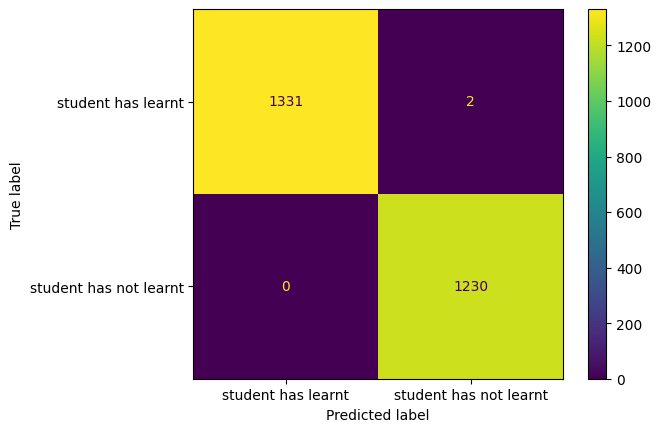

In [67]:
cm_disp=ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['student has learnt', 'student has not learnt'])
cm_disp.plot()
plt.savefig('confusion_matrix_plot.png')

Precision and Recall Score

In [47]:
#finding the precision and recall score
precision_score(Y_test,X_test_prediction)


0.9983766233766234

In [48]:
recall_score(Y_test,X_test_prediction)


1.0

F1 Score

In [49]:
#Calculating F1 score
f1_score(Y_test,X_test_prediction)

0.9991876523151909

Precision_Recall_Curve

In [55]:
#Precision Recall Curve
precisions, recalls, thresholds=precision_recall_curve(X_test_prediction,Y_test)

In [56]:
precisions

array([0.4806867, 1.       , 1.       ])

In [57]:
recalls

array([1.        , 0.99837662, 0.        ])

In [58]:
thresholds

array([0., 1.])

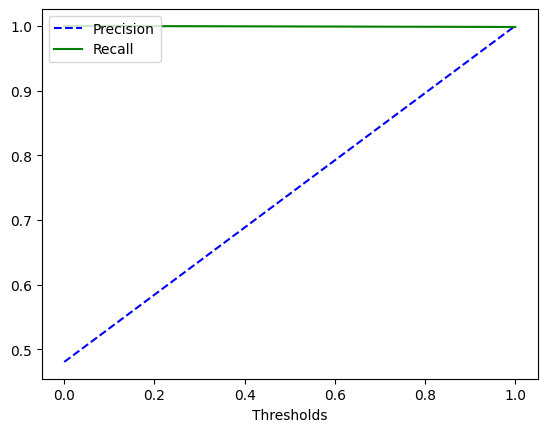

<Figure size 640x480 with 0 Axes>

In [65]:
#Precision Recall Curve Plotting
plt.plot(thresholds,precisions[:-1],'b--',label='Precision')
plt.plot(thresholds,recalls[:-1],'g-',label='Recall')
plt.xlabel('Thresholds')
plt.legend(loc='upper left')
# plt.ylim([0,1])
plt.show()
plt.savefig('precison_recall_curve.png')

Pie plot for: SubjectID


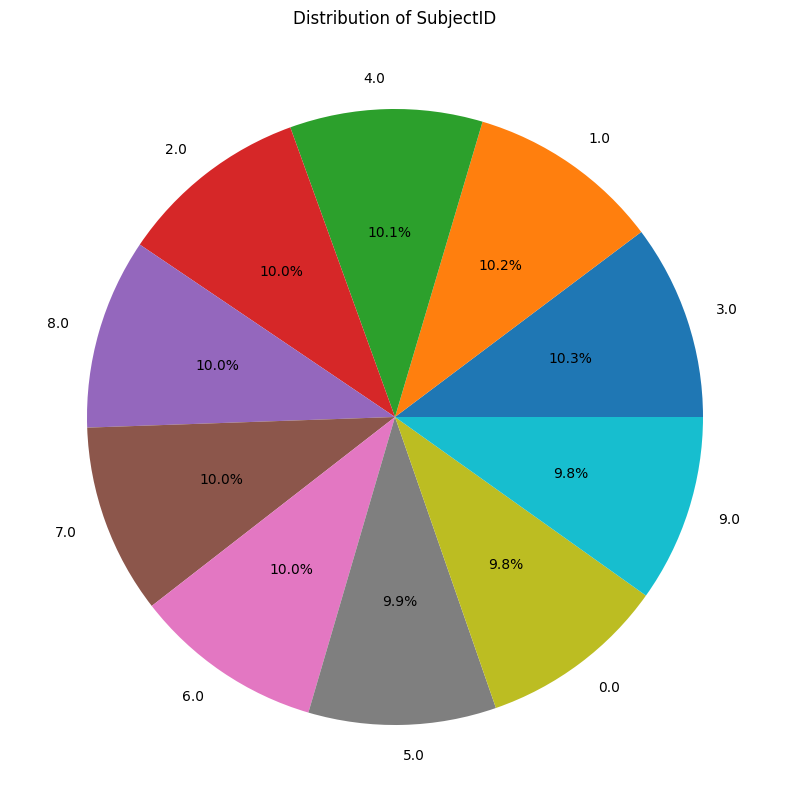



Pie plot for: VideoID


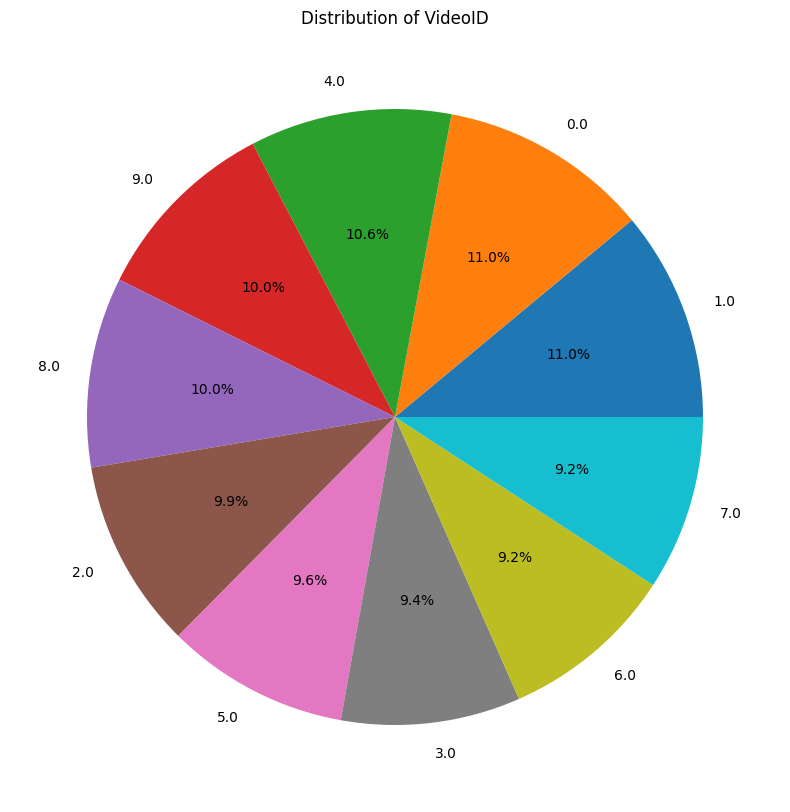



Pie plot for: Attention


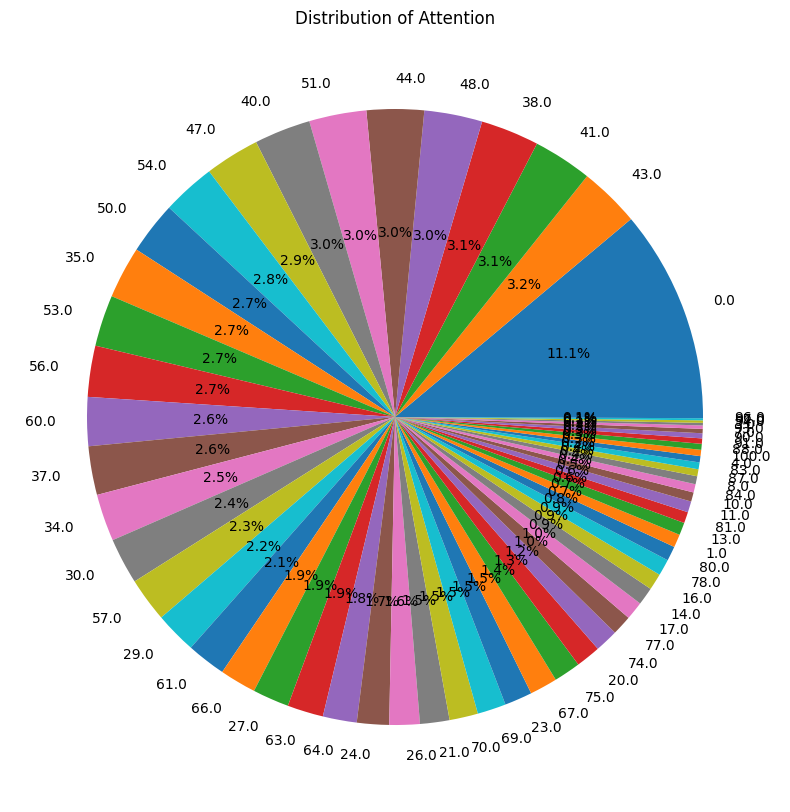



Pie plot for: Mediation


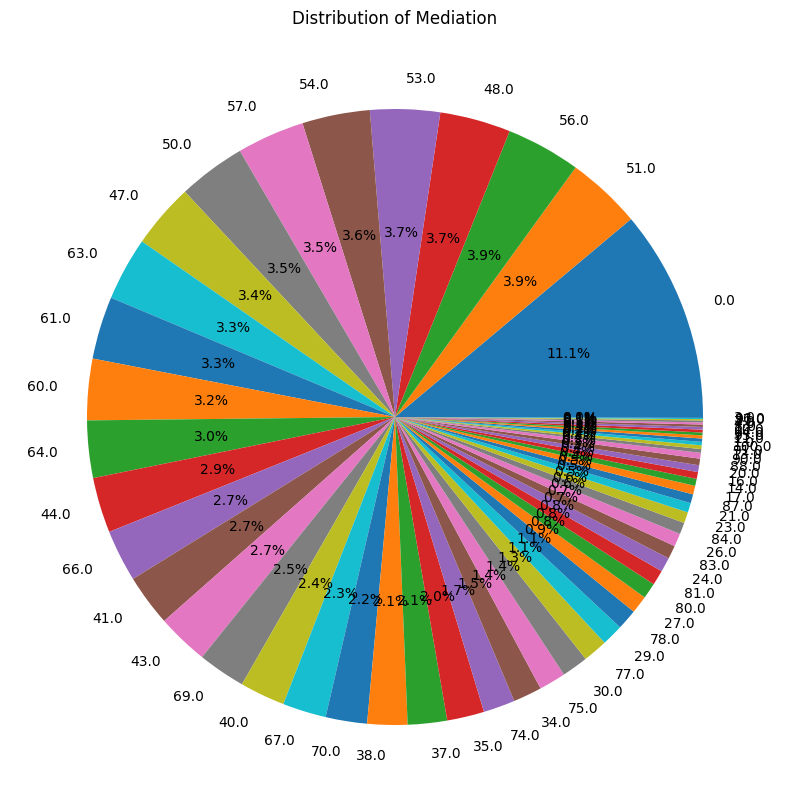



Pie plot for: Raw


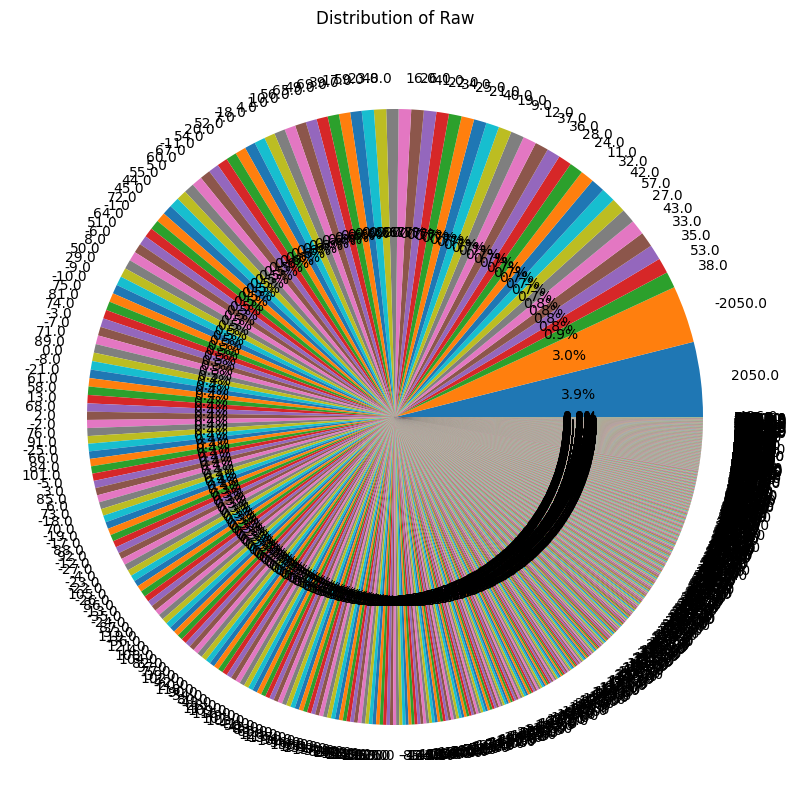



Pie plot for: Delta


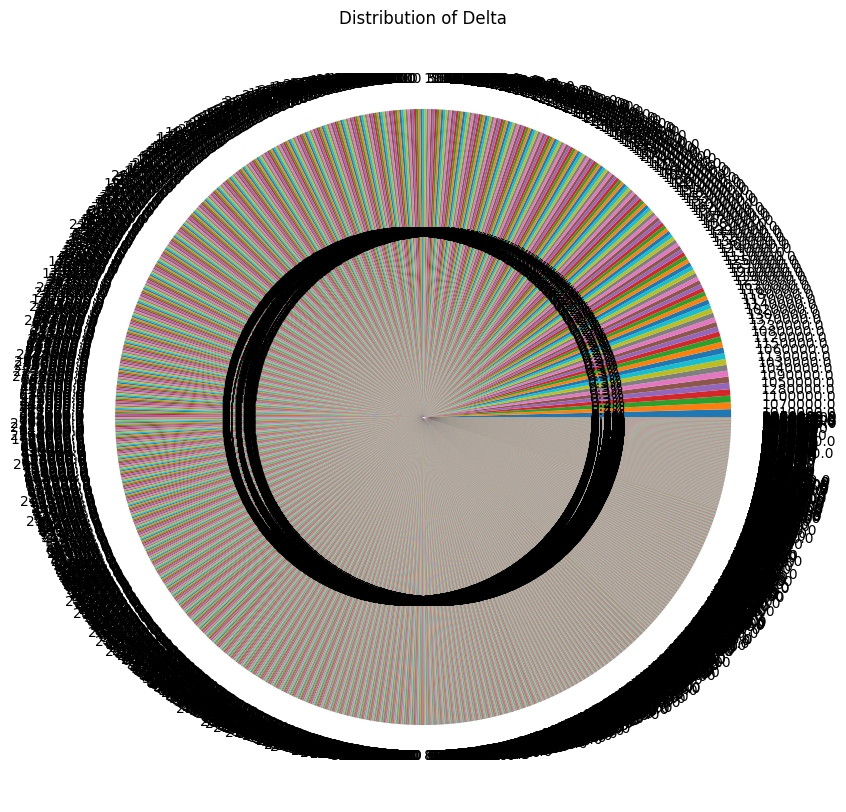



Pie plot for: Theta


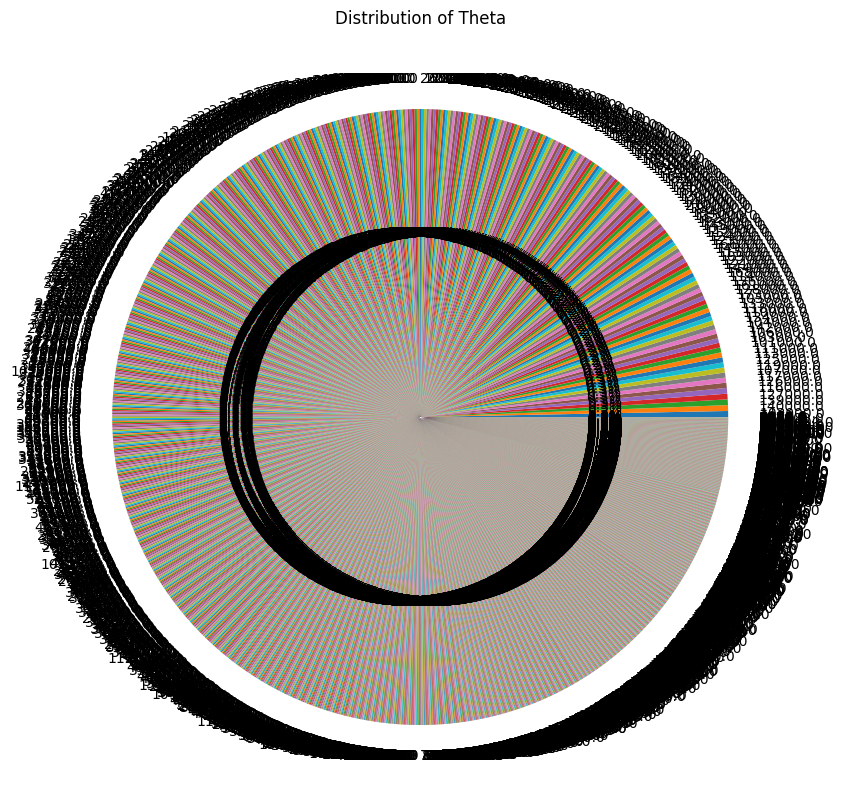



Pie plot for: Alpha1


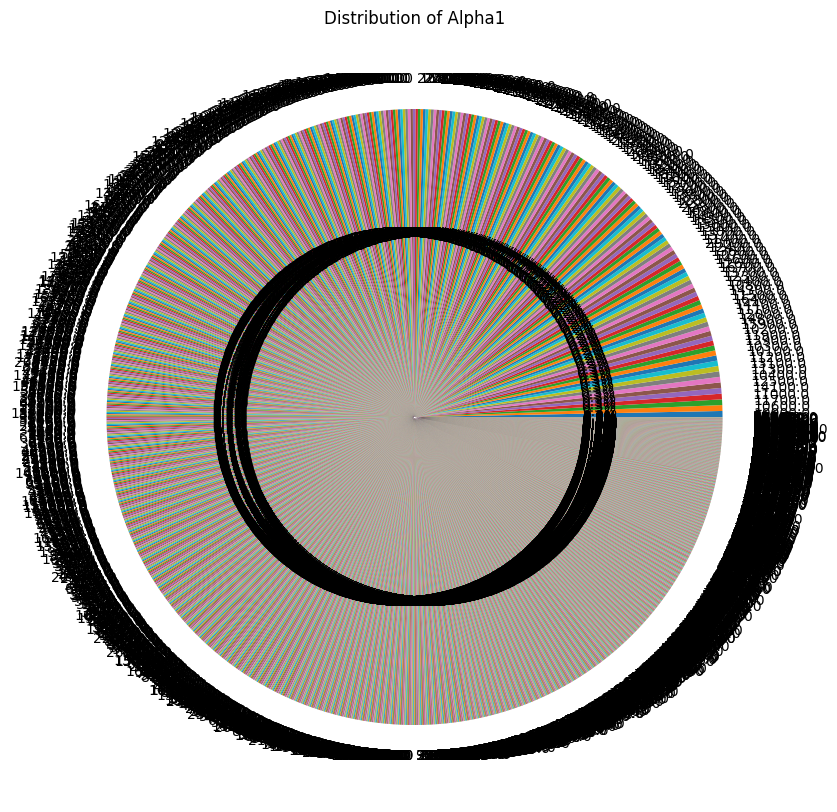



Pie plot for: Alpha2


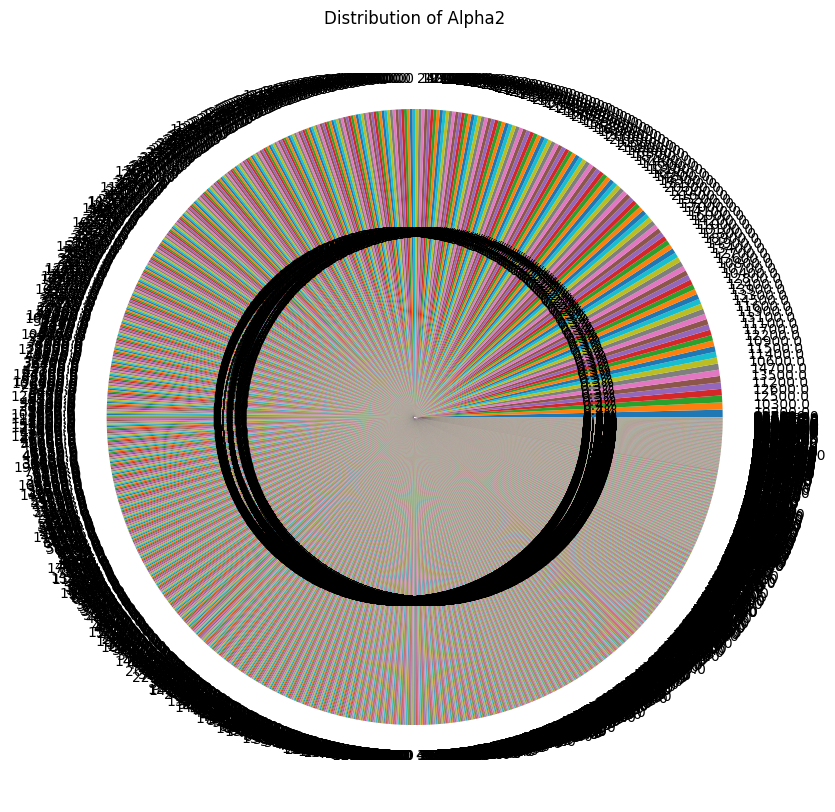



Pie plot for: Beta1


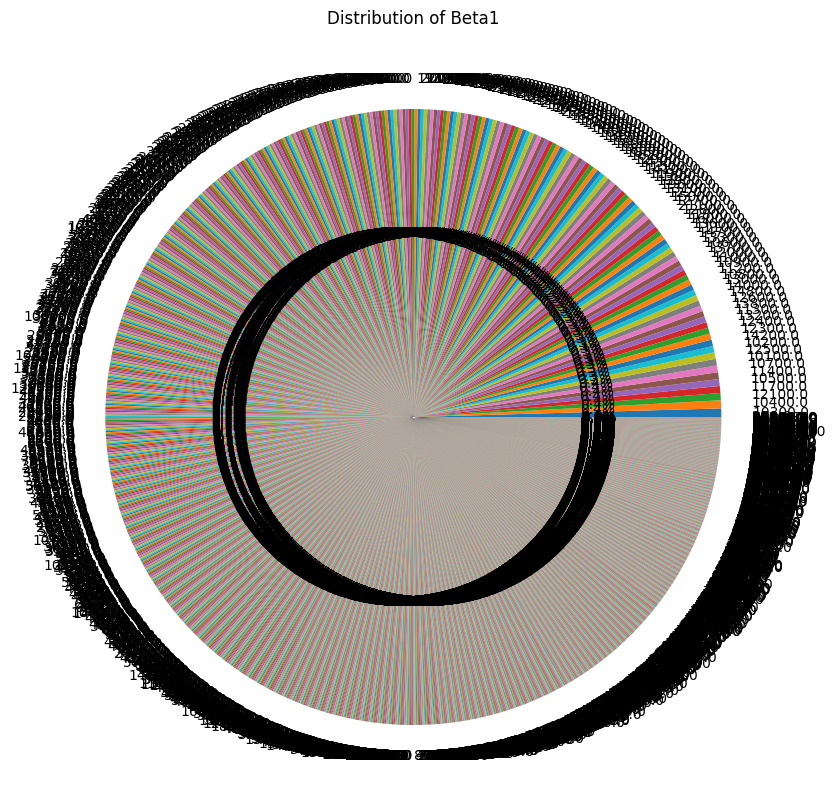



Pie plot for: Beta2


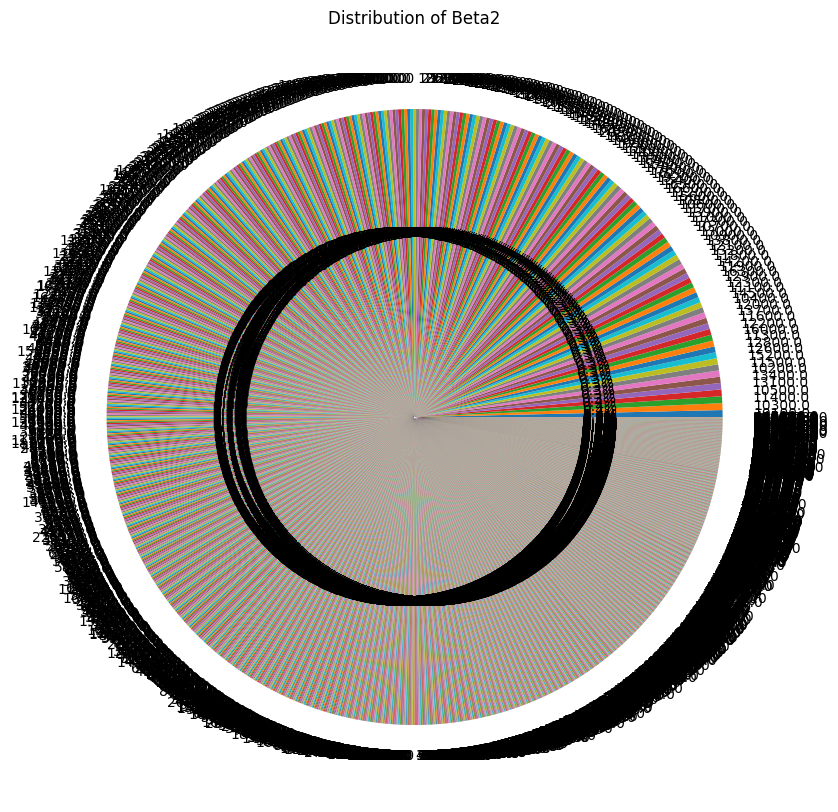



Pie plot for: Gamma1


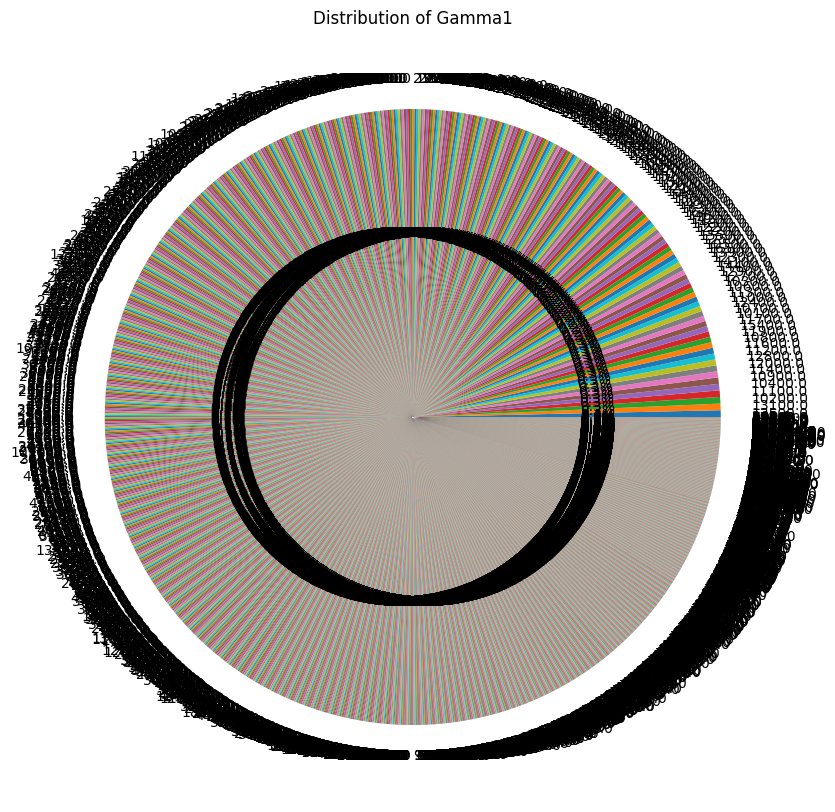



Pie plot for: Gamma2


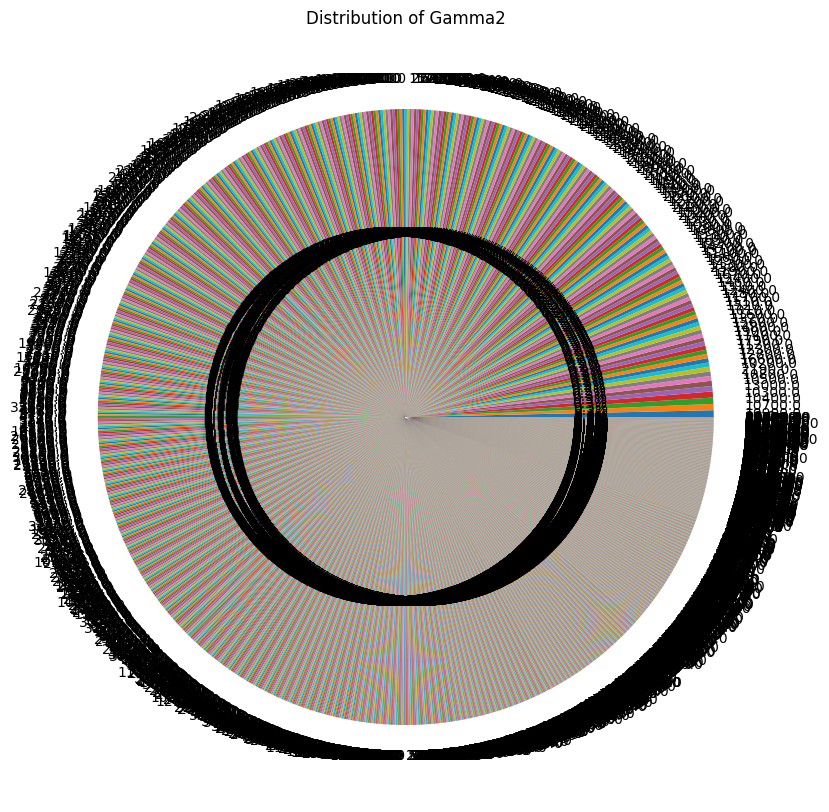



Pie plot for: predefinedlabel


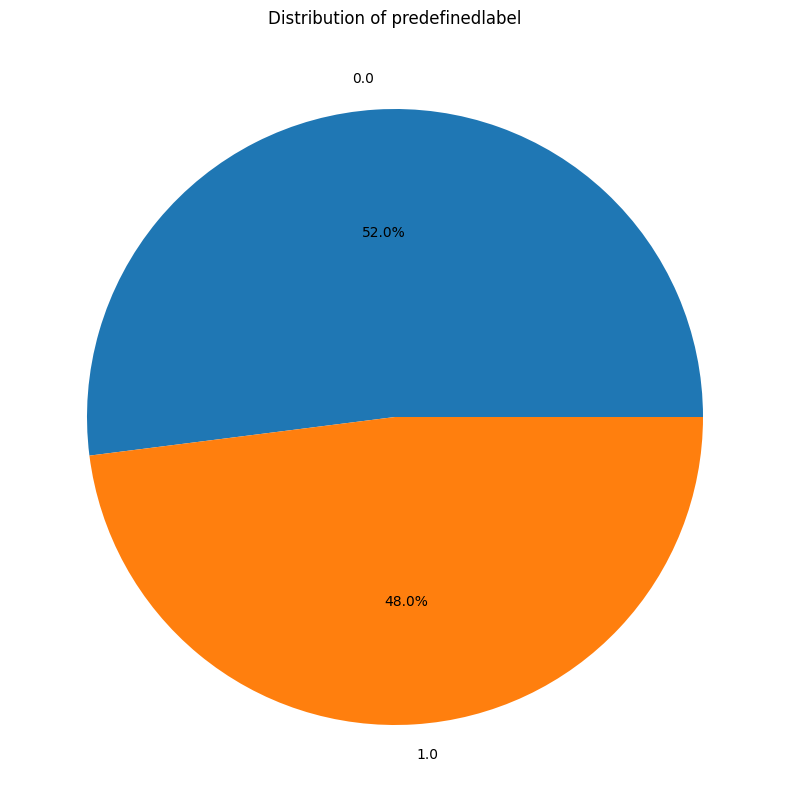



Pie plot for: user-definedlabeln


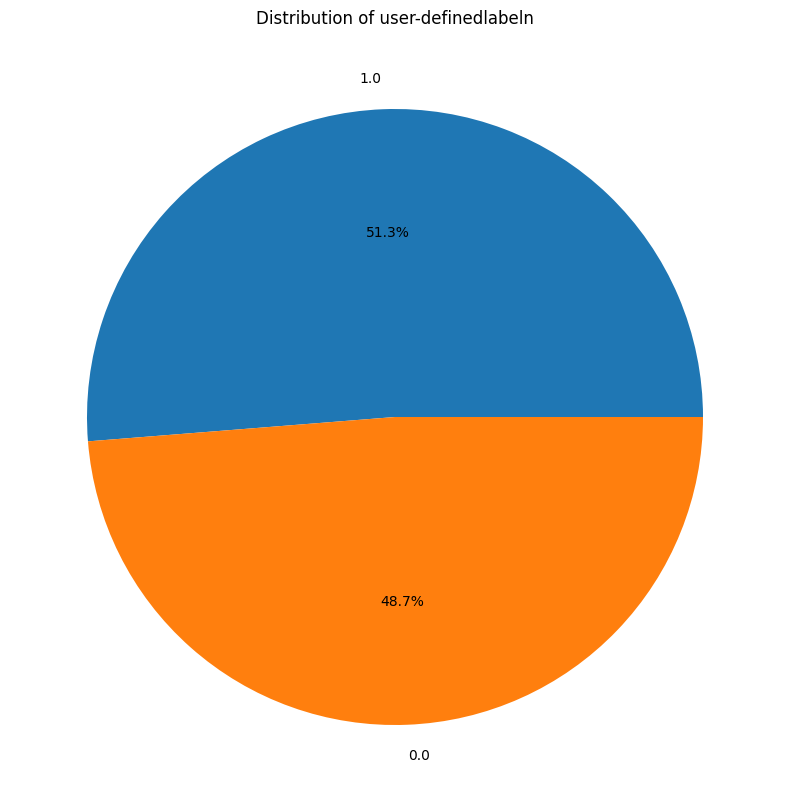

In [69]:
for i in eeg_dataset.columns:
    print('Pie plot for:', i)
    plt.figure(figsize=(20, 10))
    eeg_dataset[i].value_counts().plot(kind='pie', autopct='%1.1f%%')
    plt.title('Distribution of ' + i)
    plt.ylabel('')
    plt.show()
    print('\n')

In [70]:
import plotly.graph_objects as px

In [ ]:
fig = px.Figure(data=px.Violin(y=eeg_dataset['user-definedlabeln'], box_visible=True, line_color='black',
                               meanline_visible=True, fillcolor='lightseagreen', opacity=0.6,
                               x0='user-definedlabeln'))

fig.update_layout(yaxis_zeroline=False)
fig.show()

Density Histoplot

<Axes: ylabel='Density'>

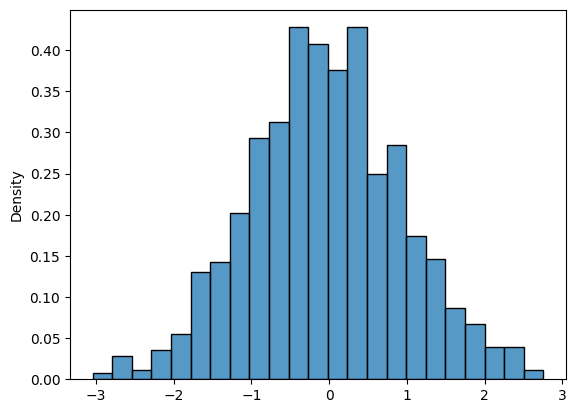

In [ ]:
import numpy as np
import seaborn as sns

# Data simulation
rng = np.random.RandomState(0)
x = rng.normal(0, 1, size = 1000)
eeg_dataset = {'x': x}

sns.histplot(x = x, stat = "density")

Frequency Histoplot

<Axes: ylabel='Frequency'>

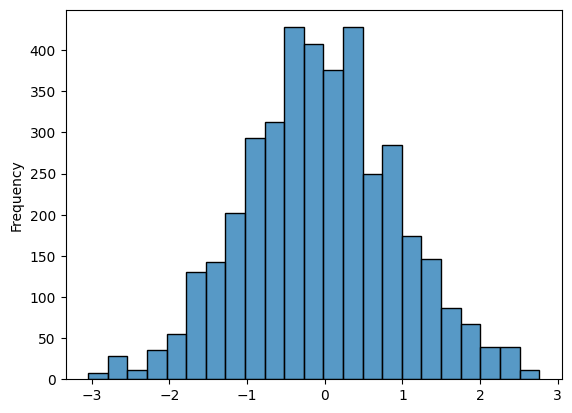

In [ ]:
import numpy as np
import seaborn as sns

# Data simulation
rng = np.random.RandomState(0)
x = rng.normal(0, 1, size = 1000)
eeg_dataset = {'x': x}

sns.histplot(x = x, stat = "frequency")

binwidth

<Axes: ylabel='Count'>

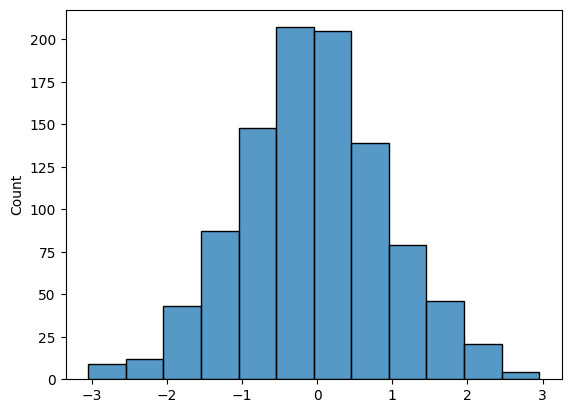

In [ ]:
import numpy as np
import seaborn as sns

# Data simulation
rng = np.random.RandomState(0)
x = rng.normal(0, 1, size = 1000)
eeg_dataset = {'x': x}

sns.histplot(x = x, binwidth = 0.5)

bins histolplot

<Axes: ylabel='Count'>

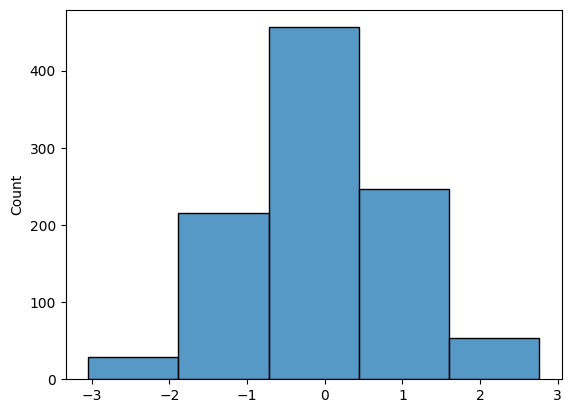

In [ ]:
import numpy as np
import seaborn as sns

# Data simulation
rng = np.random.RandomState(0)
x = rng.normal(0, 1, size = 1000)
eeg_dataset = {'x': x}

sns.histplot(x = x, bins = 5)

<Axes: ylabel='Count'>

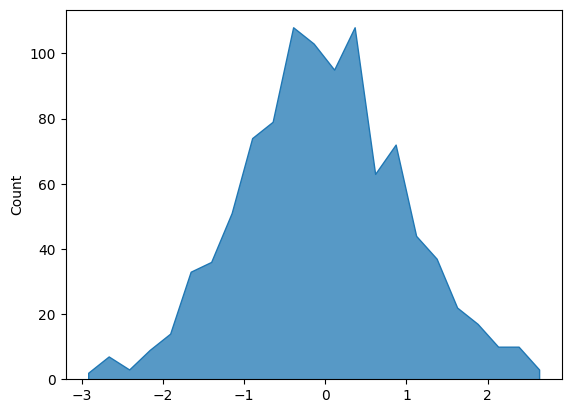

In [ ]:
import numpy as np
import seaborn as sns

# Data simulation
rng = np.random.RandomState(0)
x = rng.normal(0, 1, size = 1000)
eeg_dataset = {'x': x}

sns.histplot(x = x, element = "poly")

<Axes: xlabel='x', ylabel='Count'>

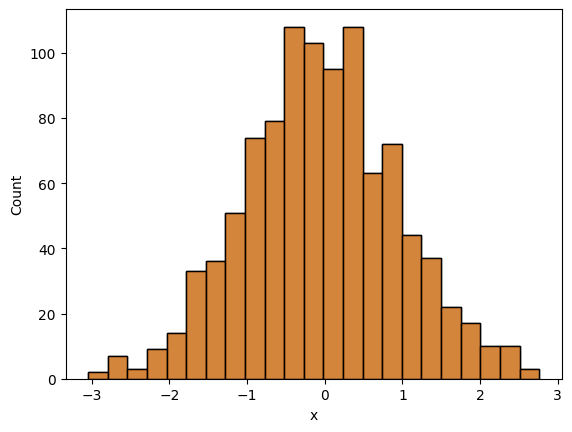

In [ ]:
import numpy as np
import seaborn as sns

# Data simulation
rng = np.random.RandomState(0)
x = rng.normal(0, 1, size = 1000)
eeg_dataset = {'x': x}

# Histogram
sns.histplot(x = x)

# Equivalent to:
sns.histplot(x = "x", data = eeg_dataset)

<Axes: ylabel='Count'>

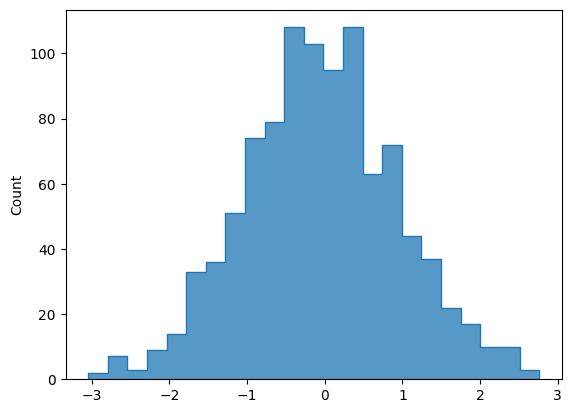

In [ ]:
import numpy as np
import seaborn as sns

# Data simulation
rng = np.random.RandomState(0)
x = rng.normal(0, 1, size = 1000)
eeg_dataset = {'x': x}

sns.histplot(x = x, element = "step")

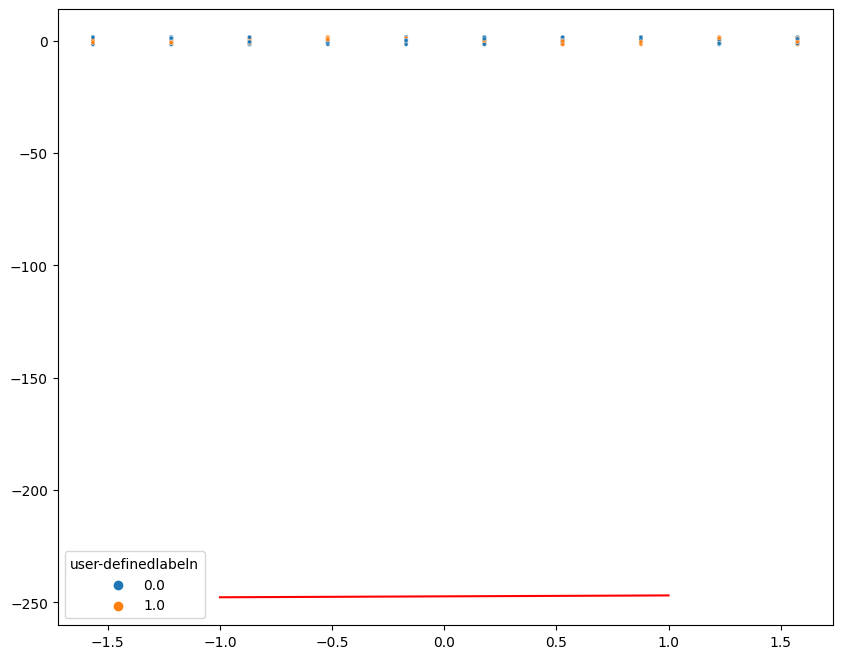

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 8))
# Plotting our two-features-space
sns.scatterplot(x=X_test[:, 0],
                y=X_test[:, 1],
                hue=Y_test,
                s=8);
# Constructing a hyperplane using a formula.
w = classifier.coef_[0]           # w consists of 2 elements
b = classifier.intercept_[0]      # b consists of 1 element
x_points = np.linspace(-1, 1)    # generating x-points from -1 to 1
y_points = -(w[0] / w[1]) * x_points - b / w[1]  # getting corresponding y-points
# Plotting a red hyperplane
plt.plot(x_points, y_points, c='r');